In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torch import nn
from torch.optim import SGD
from torch.utils.data import Dataset, DataLoader


(799, 785, 3)
(799, 785, 3)
(799, 785, 4)


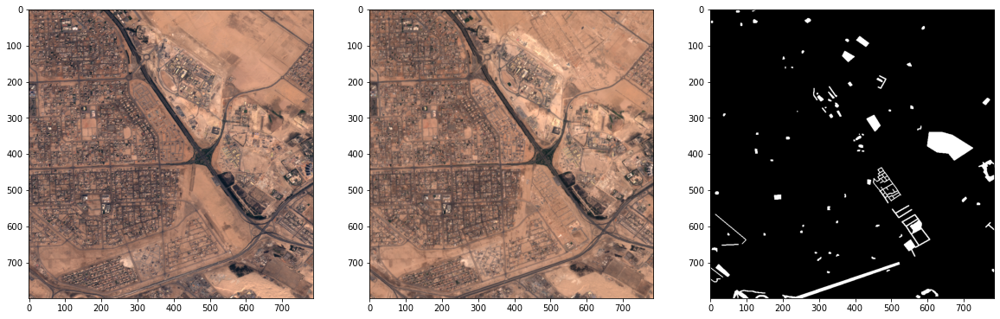

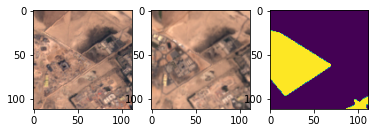

(471, 525, 3)
(471, 525, 3)
(471, 525, 3)


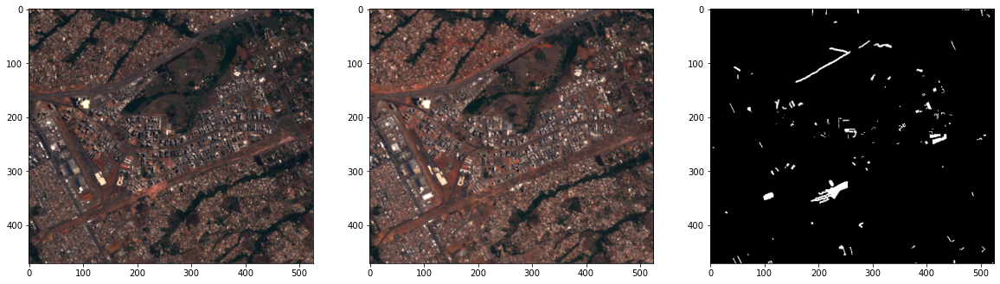

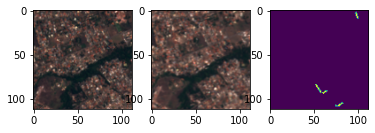

(902, 772, 3)
(902, 772, 3)
(902, 772, 4)


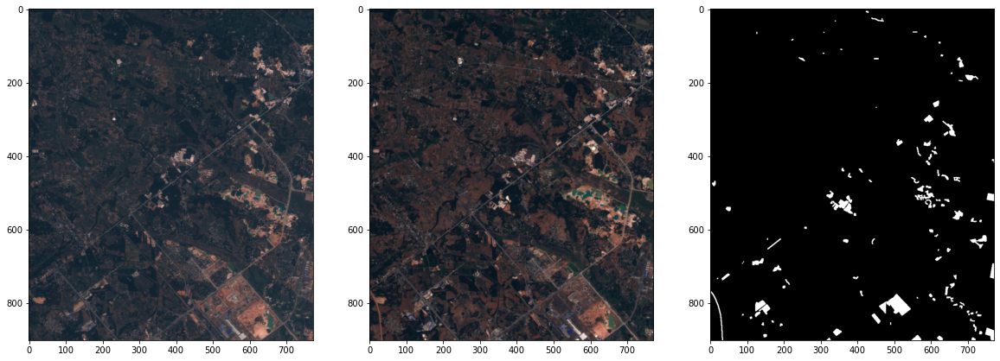

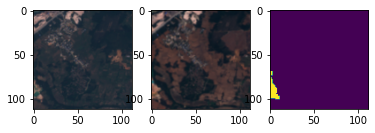

(1180, 1070, 3)
(1180, 1070, 3)
(1180, 1070, 4)


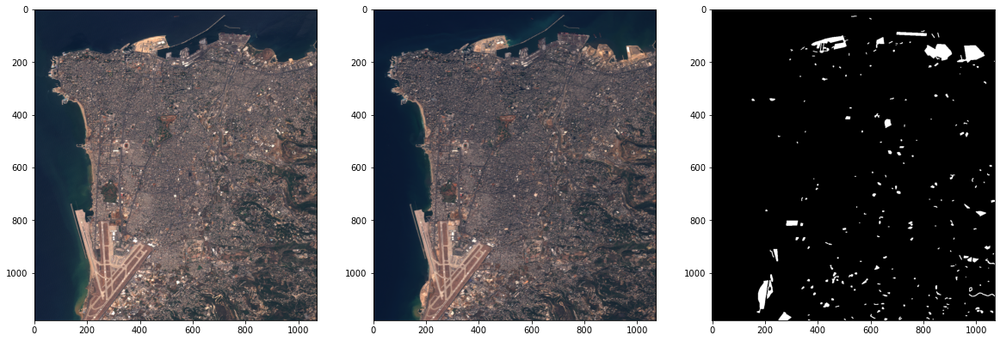

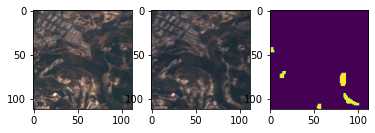

(395, 360, 3)
(395, 360, 3)
(395, 360, 4)


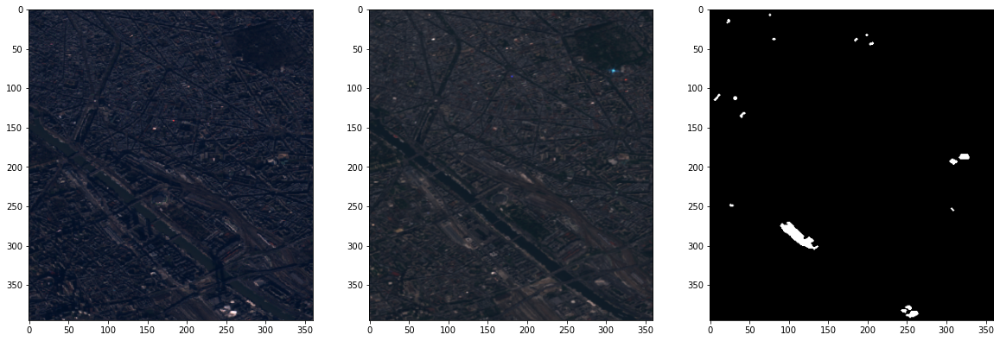

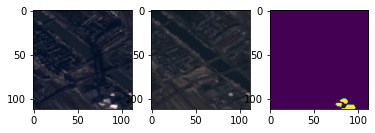

(517, 461, 3)
(517, 461, 3)
(517, 461, 4)


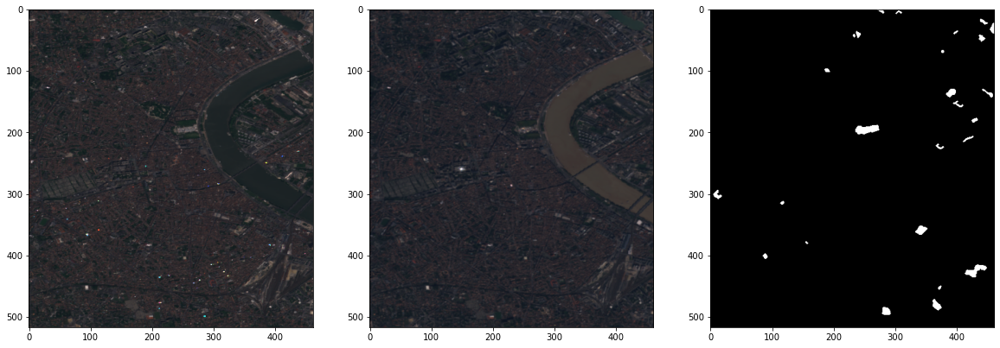

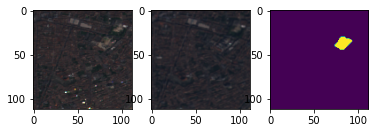

(1015, 788, 3)
(1015, 788, 3)
(1015, 788, 4)


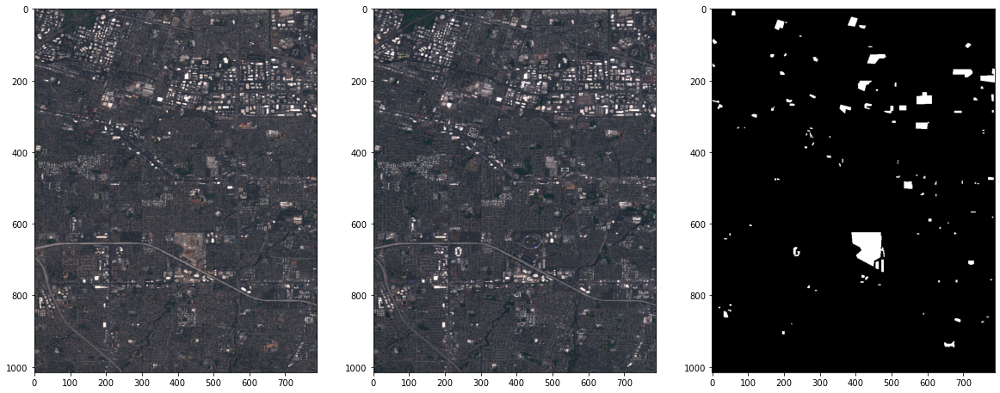

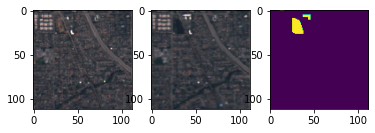

(695, 540, 3)
(695, 540, 3)
(695, 540, 4)


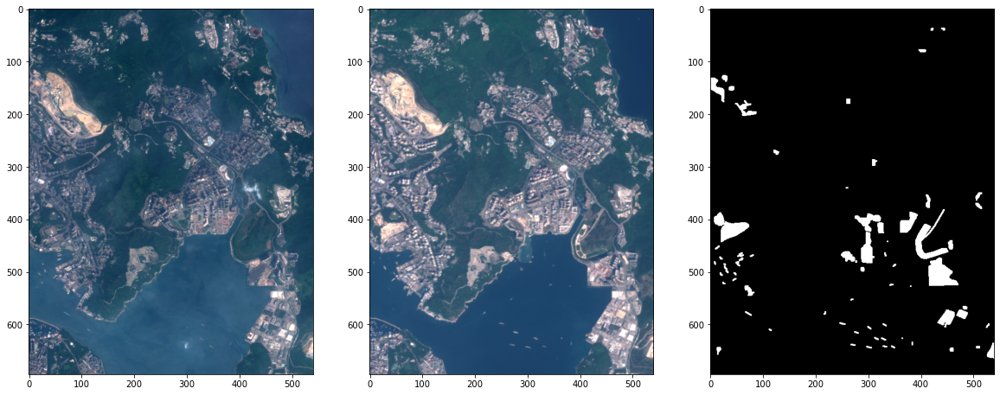

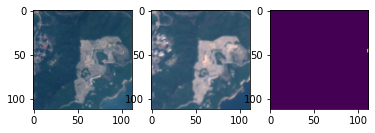

(858, 557, 3)
(858, 557, 3)
(858, 557, 4)


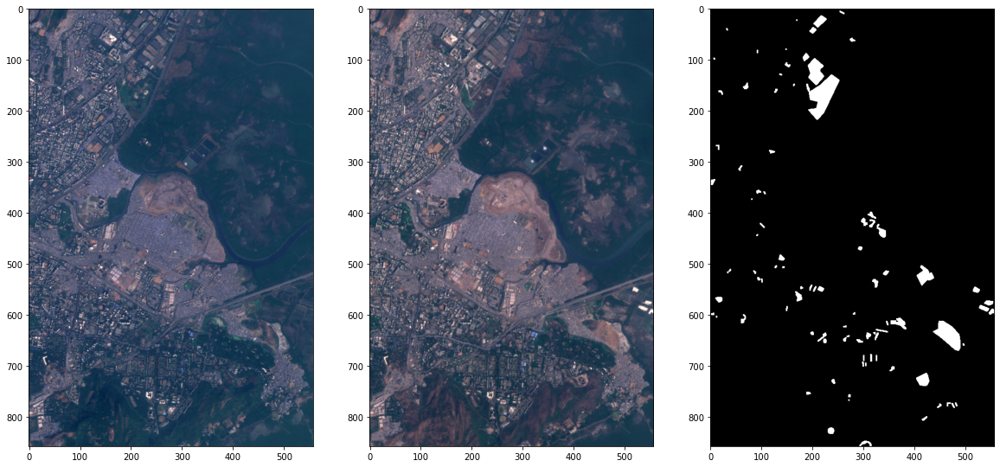

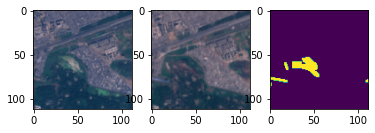

(522, 582, 3)
(522, 582, 3)
(522, 582, 4)


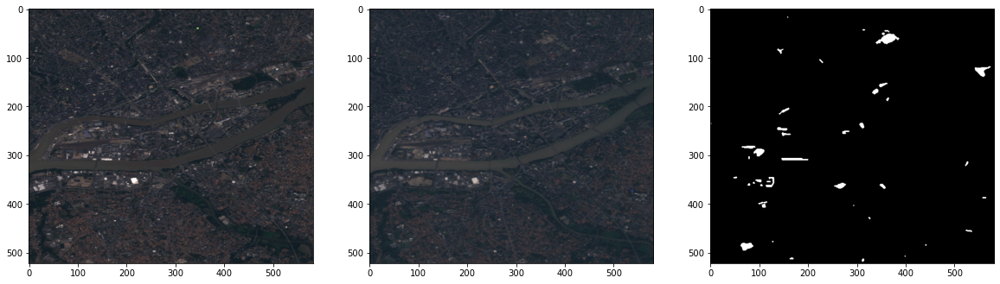

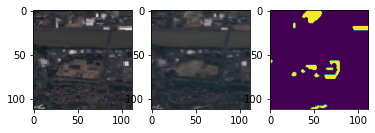

(408, 390, 3)
(408, 390, 3)
(408, 390, 4)


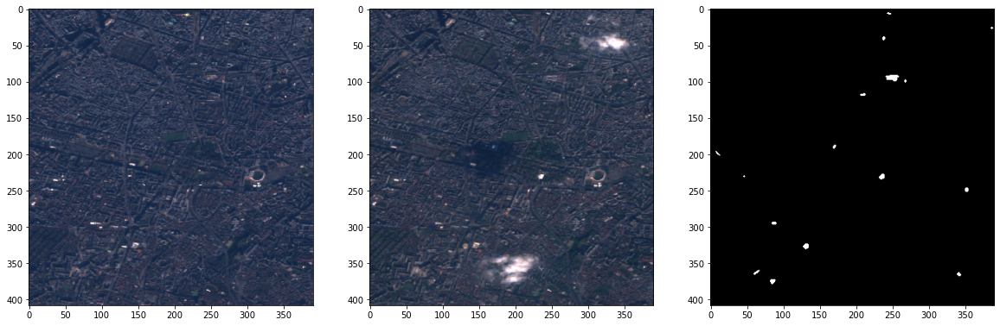

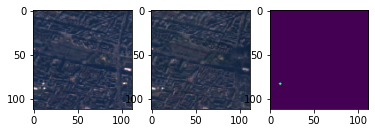

(776, 718, 3)
(776, 718, 3)
(776, 718, 4)


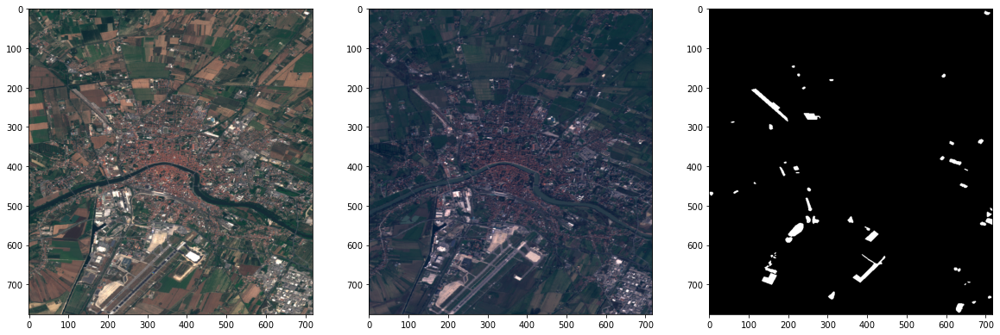

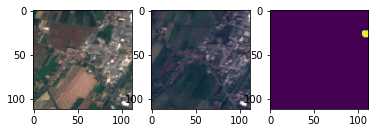

(339, 563, 3)
(339, 563, 3)
(339, 563, 4)


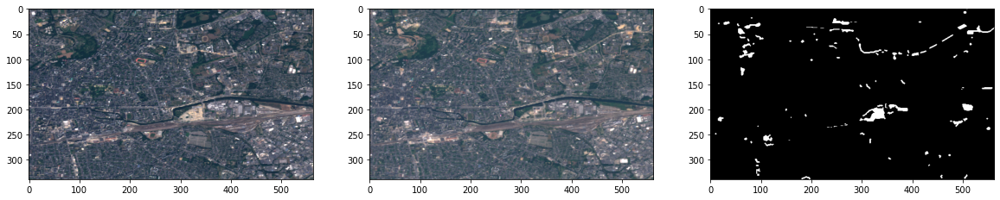

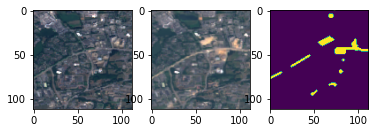

(639, 688, 3)
(639, 688, 3)
(639, 688, 4)


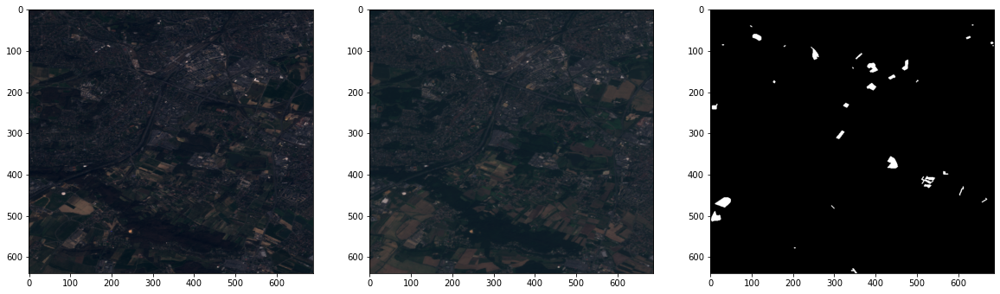

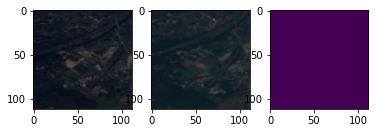

In [3]:
#dataset:

IMAGE_SIZE = 112
IMAGE_NUMBER = 2000
VISUALIZE = 1
MAIN_DIR = 'D://FACULTATE//MASTER 1//SEMESTRUL 2//PCD//OSCD dataset//'
IMAGE_FOLDER = 'images//'
LABEL_FOLDER = 'train Labels//'

#print(os.listdir(MAIN_DIR))


main_dir = MAIN_DIR
images_dir = main_dir + IMAGE_FOLDER
labels_dir = main_dir + LABEL_FOLDER
city_nm_ls = os.listdir(labels_dir)
#print(city_nm_ls)
city_nm_ls.remove('README.txt')
if not('data' in os.listdir(main_dir)):
    os.mkdir(main_dir+'data')
for city_nm in city_nm_ls:
    img_file1 = images_dir + city_nm + '/pair/img1.png'
    img1 = Image.open(img_file1)
    img1 = np.asarray(img1)
    img_file2 = images_dir + city_nm + '/pair/img2.png'
    img2 = Image.open(img_file2)
    img2 = np.asarray(img2)
    lbl_file = labels_dir + city_nm + '/cm/cm.png'
    lbl = Image.open(lbl_file)
    lbl = np.asarray(lbl)
    print(img1.shape)
    print(img2.shape)
    print(lbl.shape)
    plt.figure(figsize=(20,30))
    plt.subplot(1,3,1)
    plt.imshow(img1[:,:])
    plt.subplot(1,3,2)
    plt.imshow(img2[:,:])
    plt.subplot(1,3,3)
    plt.imshow(lbl[:,:])
    plt.show()
    #print("no: ", int((IMAGE_NUMBER-1)/len(city_nm_ls))+1)
    for i in range(int((IMAGE_NUMBER-1)/len(city_nm_ls))+1):
        x = np.random.randint(img1.shape[0]-IMAGE_SIZE)
        y = np.random.randint(img1.shape[1]-IMAGE_SIZE)
        mini_img1 = img1[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
        mini_img2 = img2[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
        mini_lbl = lbl[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE]
        data = np.zeros([7,IMAGE_SIZE,IMAGE_SIZE])
        #print(data,"\n")
        data[:3,:,:] = mini_img1.transpose([2,0,1])
        data[3:6,:,:] = mini_img2.transpose([2,0,1])
        #print(mini_lbl)
        #print(data)
        #print(mini_lbl.shape)
        data[6,:,:] = mini_lbl[:,:,0]
        #file_nm = main_dir + 'data/train/' + city_nm + str(i).zfill(3) + '.npy'
        #np.save(file_nm, data)
        if VISUALIZE and i == 100:
            plt.figure()
            plt.subplot(1,3,1)
            plt.imshow(mini_img1)
            plt.subplot(1,3,2)
            plt.imshow(mini_img2)
            plt.subplot(1,3,3)
            plt.imshow(mini_lbl[:,:,0])
            plt.show()



(433, 469, 3)
(433, 469, 3)
(433, 469)


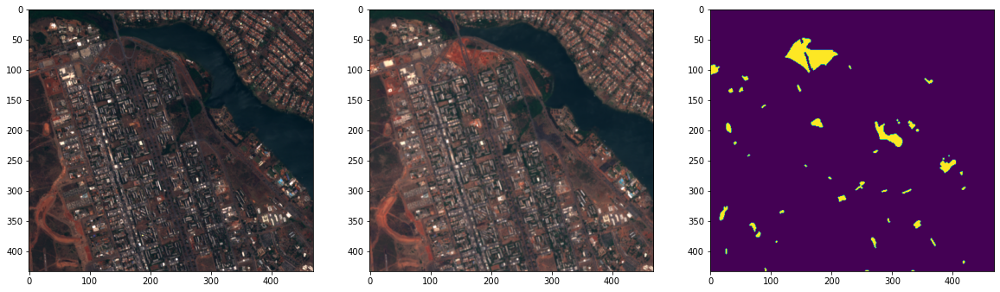

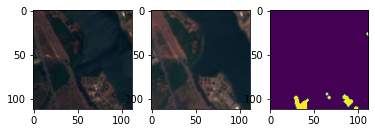

(730, 544, 3)
(730, 544, 3)
(730, 544)


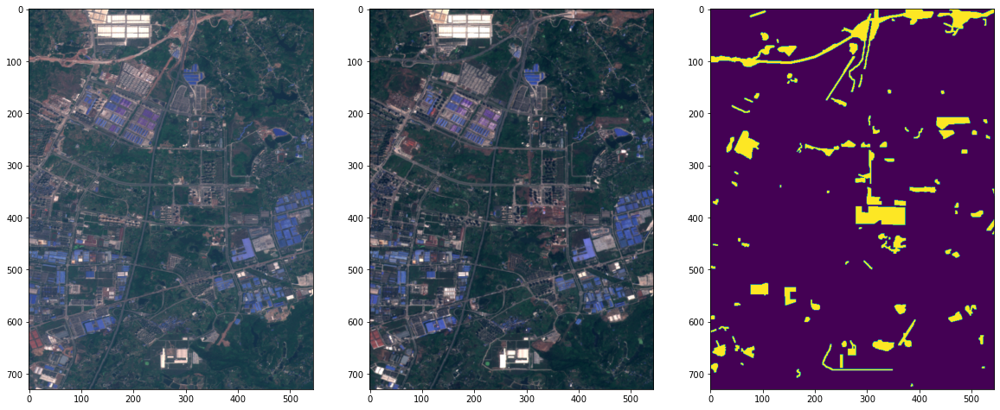

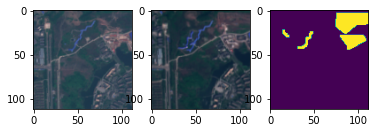

(774, 634, 3)
(774, 634, 3)
(774, 634)


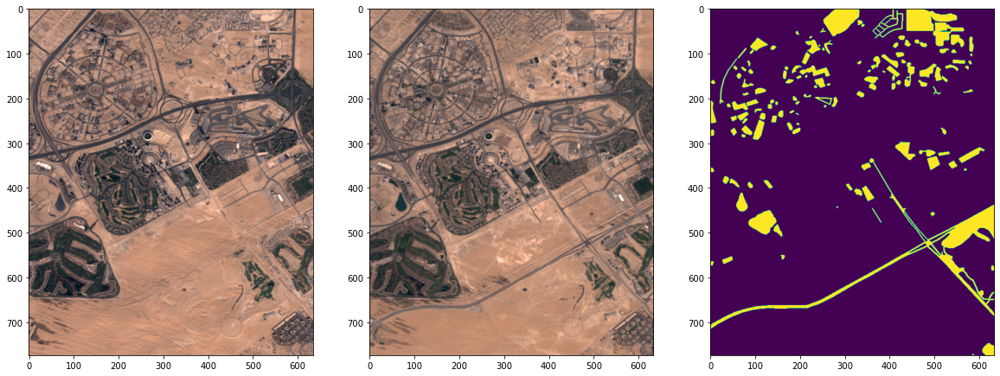

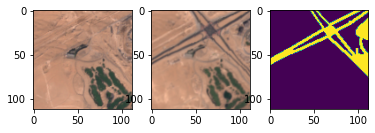

(824, 716, 3)
(824, 716, 3)
(824, 716)


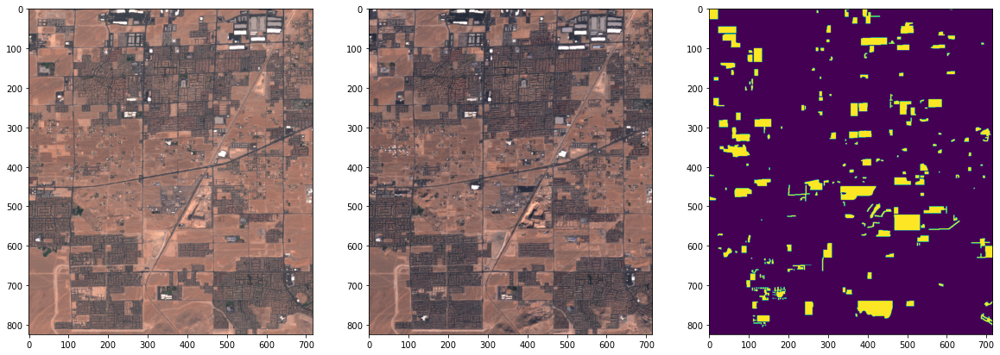

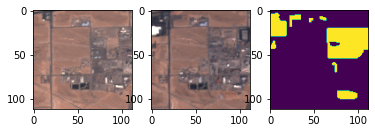

(545, 558, 3)
(545, 558, 3)
(545, 558)


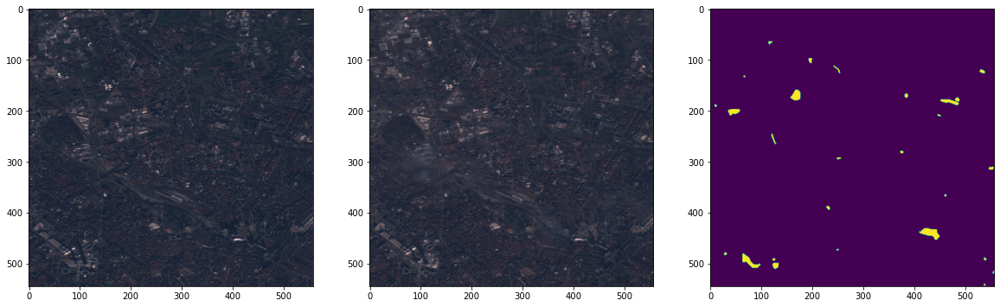

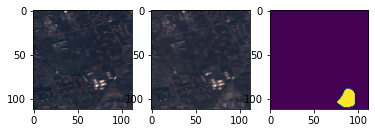

(426, 451, 3)
(426, 451, 3)
(426, 451)


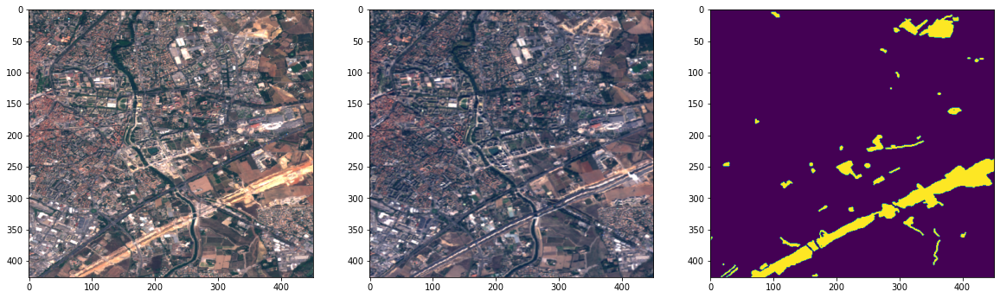

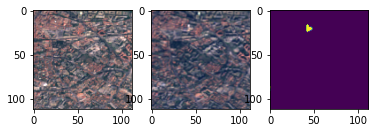

(241, 385, 3)
(241, 385, 3)
(241, 385)


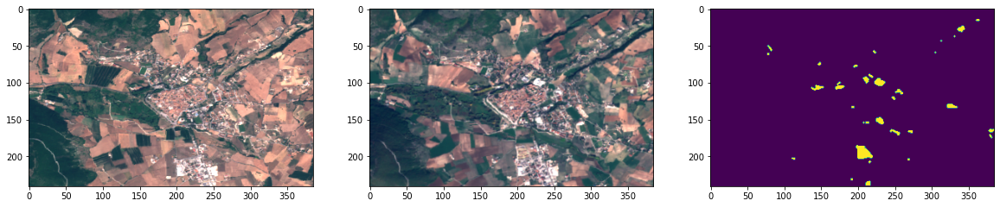

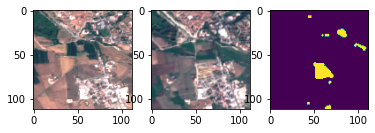

(353, 426, 3)
(353, 426, 3)
(353, 426)


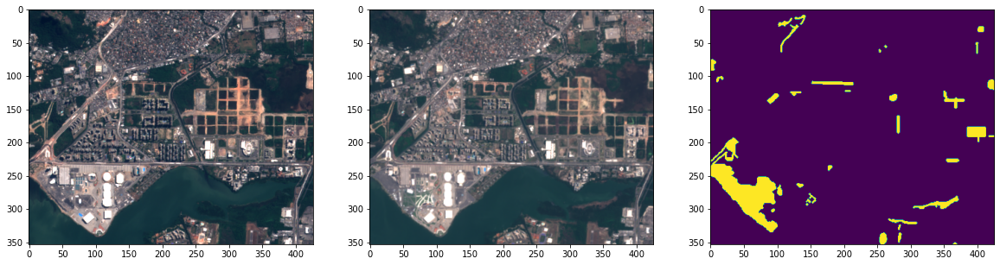

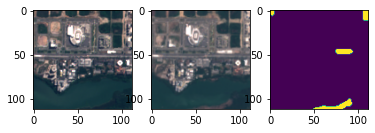

(639, 688, 3)
(639, 688, 3)
(639, 688)


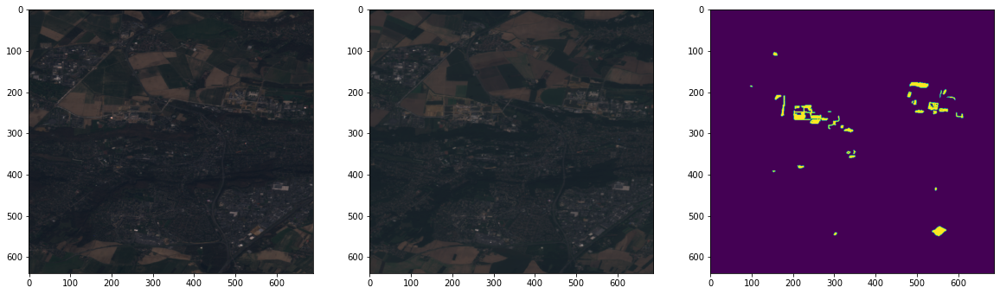

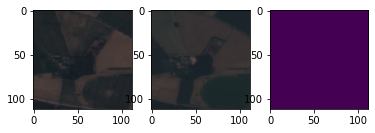

(458, 476, 3)
(458, 476, 3)
(458, 476)


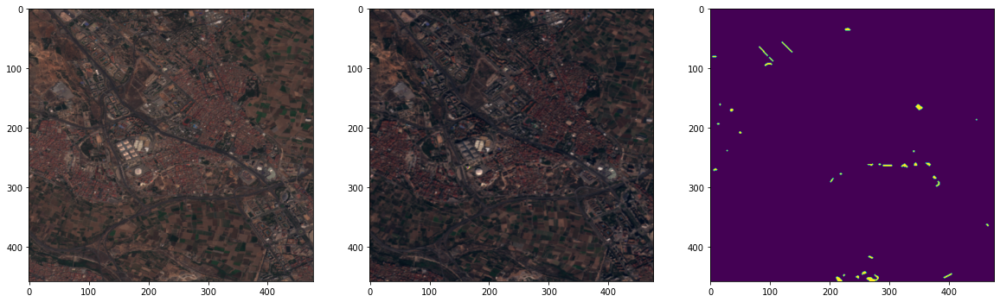

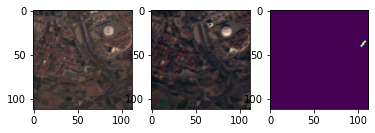

In [4]:
IMAGE_SIZE = 112
IMAGE_NUMBER = 2000
VISUALIZE = 1
MAIN_DIR = 'D://FACULTATE//MASTER 1//SEMESTRUL 2//PCD//OSCD dataset//'
IMAGE_FOLDER = 'images//'
LABEL_FOLDER = 'test Labels//'

def main():
    main_dir = MAIN_DIR
    images_dir = main_dir + IMAGE_FOLDER
    labels_dir = main_dir + LABEL_FOLDER
    city_nm_ls = os.listdir(labels_dir)
    city_nm_ls.remove('README.txt')
    if not('data' in os.listdir(main_dir)):
        os.mkdir(main_dir+'data')
    for city_nm in city_nm_ls:
        img_file1 = images_dir + city_nm + '/pair/img1.png'
        img1 = Image.open(img_file1)
        img1 = np.asarray(img1)
        img_file2 = images_dir + city_nm + '/pair/img2.png'
        img2 = Image.open(img_file2)
        img2 = np.asarray(img2)
        lbl_file = labels_dir + city_nm + '/cm/cm.png'
        lbl = Image.open(lbl_file)
        lbl = np.asarray(lbl)
        print(img1.shape)
        print(img2.shape)
        print(lbl.shape)
        
        plt.figure(figsize=(20,30))
        plt.subplot(1,3,1)
        plt.imshow(img1[:,:])
        plt.subplot(1,3,2)
        plt.imshow(img2[:,:])
        plt.subplot(1,3,3)
        plt.imshow(lbl[:,:])
        plt.show()
        
        #print("img1.shape: ", img1.shape)
        #print("img2.shape: ", img2.shape)
        #print("lbl.shape: ", lbl.shape)
        #print("no: ", int((IMAGE_NUMBER-1)/len(city_nm_ls))+1)
        for i in range(int((IMAGE_NUMBER-1)/len(city_nm_ls))+1):
            
            x = np.random.randint(img1.shape[0]-IMAGE_SIZE)
            y = np.random.randint(img1.shape[1]-IMAGE_SIZE)
            #print("x si y:", x,y)
            mini_img1 = img1[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
            mini_img2 = img2[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
            mini_lbl = lbl[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE]
            #print("mini_img1 shape: ",mini_img1.shape)
            #print("mini_img2 shape: ",mini_img2.shape)
            #print("mini_lbl shape: ",mini_lbl.shape)
            data = np.zeros([7,IMAGE_SIZE,IMAGE_SIZE])
            #print("initial data shape: ", data.shape)
            data[:3,:,:] = mini_img1.transpose([2,0,1])
            data[3:6,:,:] = mini_img2.transpose([2,0,1])
            data[6,:,:] = mini_lbl[:,:]
            
            #file_nm = main_dir + 'data/test/' + city_nm + str(i).zfill(3) + '.npy'
            #np.save(file_nm, data)
            if VISUALIZE and i==100:
                plt.figure()
                plt.subplot(1,3,1)
                plt.imshow(mini_img1)
                plt.subplot(1,3,2)
                plt.imshow(mini_img2)
                plt.subplot(1,3,3)
                plt.imshow(mini_lbl[:,:])
                plt.show()

main()

In [7]:
class convx2(nn.Module):
    def __init__(self, *ch):
        super(convx2, self).__init__()
        self.conv_number = len(ch)-1
        self.model = nn.Sequential()
        for i in range(self.conv_number):
            self.model.add_module('conv{0}'.format(i),nn.Conv2d(ch[i], ch[i+1], 3, 1, 1))

    def forward(self, x):
        y = self.model(x)
        return y

class convx2(nn.Module):
    def __init__(self, *ch):
        super(convx2, self).__init__()
        self.conv_number = len(ch)-1
        self.model = nn.Sequential()
        for i in range(self.conv_number):
            self.model.add_module('conv{0}'.format(i),nn.Conv2d(ch[i], ch[i+1], 3, 1, 1))

    def forward(self, x):
        y = self.model(x)
        return y
    
class FC_EF(nn.Module):
    def __init__(self, in_ch = 3):
        super(FC_EF, self).__init__()
        self.conv1 = convx2(*[in_ch*2, 16, 16])
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = convx2(*[16, 32, 32])
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = convx2(*[32, 64, 64, 64])
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv4 = convx2(*[64, 128, 128, 128])
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.deconv1 = nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2)
        self.conv5 = convx2(*[256, 128, 128, 64])
        self.deconv2 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)
        self.conv6 = convx2(*[128, 64, 64, 32])
        self.deconv3 = nn.ConvTranspose2d(32, 32, kernel_size=2, stride=2)
        self.conv7 = convx2(*[64, 32, 16])
        self.deconv4 = nn.ConvTranspose2d(16, 16, kernel_size=2, stride=2)
        self.conv8 = convx2(*[32, 16, 2])

    def forward(self, x1, x2):
        h1 = self.conv1(torch.cat((x1,x2), 1))
        h = self.pool1(h1)
        h2 = self.conv2(h)
        h = self.pool2(h2)
        h3 = self.conv3(h)
        h = self.pool3(h3)
        h4 = self.conv4(h)
        h = self.pool4(h4)
        h = self.deconv1(h)
        h = self.conv5(torch.cat((h, h4), 1))
        h = self.deconv2(h)
        h = self.conv6(torch.cat((h, h3), 1))
        h = self.deconv3(h)
        h = self.conv7(torch.cat((h, h2), 1))
        h = self.deconv4(h)
        h = self.conv8(torch.cat((h, h1), 1))
        y = h
        return y

In [8]:
class OSCD(Dataset):
    def __init__(self, dir_nm):
        super(OSCD, self).__init__()
        self.dir_nm = dir_nm
        self.file_ls = os.listdir(dir_nm)
        self.file_size = len(self.file_ls)

    def __getitem__(self, idx):
        mat = np.load(self.dir_nm + self.file_ls[idx]).astype(np.float)
        x1 = mat[:3,:,:]/255
        x2 = mat[3:6,:,:]/255
        lbl = mat[6,:,:]/255
        return x1, x2, lbl

    def __len__(self):
        return self.file_size

In [9]:

train_dir = MAIN_DIR+'/data/train/'
test_dir = MAIN_DIR+'/data/test/'
lr = 0.00001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_data = OSCD(train_dir)
train_dataloader = DataLoader(train_data, batch_size=10, shuffle=True)
test_data = OSCD(test_dir)
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True)
model = FC_EF().to(device, dtype=torch.float)

optimizer = SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0005)
criterion = nn.CrossEntropyLoss()

for epoch in range(10):
    loss_v = []
    model.train()
    for i, data in enumerate(train_dataloader):
        x1, x2, lbl = data
        x1 = x1.to(device, dtype=torch.float)
        x2 = x2.to(device, dtype=torch.float)
        lbl = lbl.to(device, dtype=torch.long)
        y = model(x1,x2)
        
        #print("Compose images: ")
        #print(y)
        #print("\n\nGround Truth: ")
        #print(lbl)
        optimizer.zero_grad()
        loss = criterion(y, lbl)
        loss.backward()
        optimizer.step()
        loss_v.append(loss.item())
        if(i%20==0 and i>0):
            print(np.mean(loss_v))
            loss_v = []

    loss_v = []
    model.eval()
    for i, data in enumerate(test_dataloader):
        x1, x2, lbl = data
        x1 = x1.to(device, dtype=torch.float)
        x2 = x2.to(device, dtype=torch.float)
        lbl = lbl.to(device, dtype=torch.long)
        y = model(x1, x2)
        optimizer.zero_grad()
        loss = criterion(y, lbl)
        loss.backward()
        optimizer.step()
        loss_v.append(loss.item())
    print('test:', np.mean(loss_v))
    loss_v = []

        

C:\Users\Marina\anaconda3\envs\IC2\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


0.6798110377220881
0.6778825521469116
0.6761404126882553
0.6742678999900817
0.6722473293542862
0.6694762527942657
0.6685633778572082
0.6667255312204361
0.6652464359998703
0.662583863735199
test: 0.5500062038898468
0.4141655606882913
0.41212302148342134
0.4109374344348907
0.40905030369758605
0.40125190168619157
0.393648786842823
0.39542667120695113
0.3843284294009209
0.38593572229146955
0.3854749619960785
test: 0.28504442135617136
0.1890856730086463
0.189390367269516
0.17528010979294778
0.18535589352250098
0.18195032998919486
0.18713139966130257
0.19603741616010667
0.1839581660926342
0.18118904531002045
0.1675104361027479
test: 0.21839065611548722
0.16597140757810502
0.16069893203675747
0.14481698907911777
0.15175428614020348
0.14275905080139636
0.15676959343254565
0.1487772699445486
0.1535502638667822
0.1449967909604311
0.1535853210836649
test: 0.21333542137034237
0.15016950383072808
0.15785661302506923
0.14143863394856454
0.15385581627488137
0.14335559979081153
0.14352135062217714
0.1

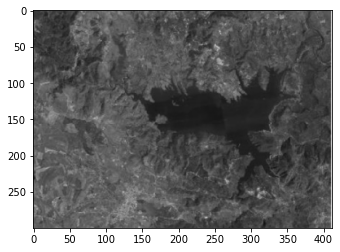

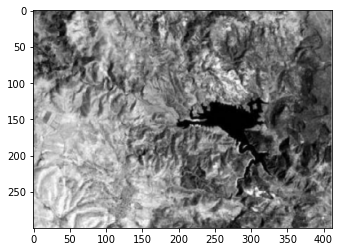

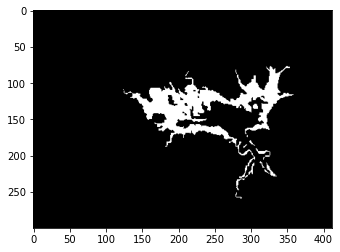

In [87]:
path = 'D:\\FACULTATE\MASTER 1\\SEMESTRUL 2\\PCD\\imagini multisenzor\\'

im_A = Image.open(path +"Img1-A.ppm")
im_B = Image.open(path +"Img1-B.ppm")
im_C = Image.open(path +"Img1-C.ppm")

plt.imshow(im_A)
plt.show()
plt.imshow(im_B)
plt.show()
plt.imshow(im_C)
plt.show()


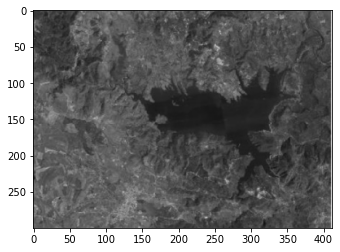

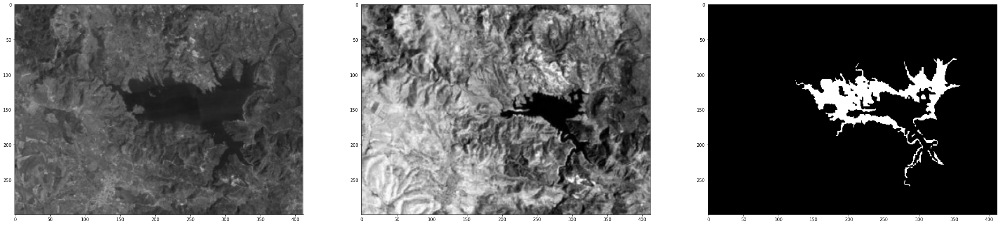

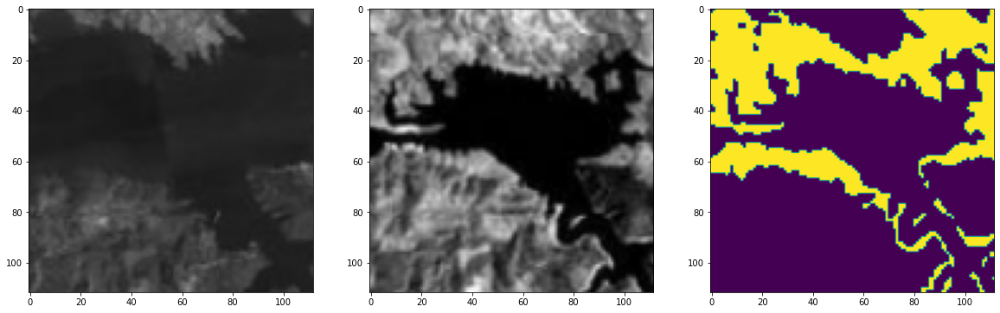

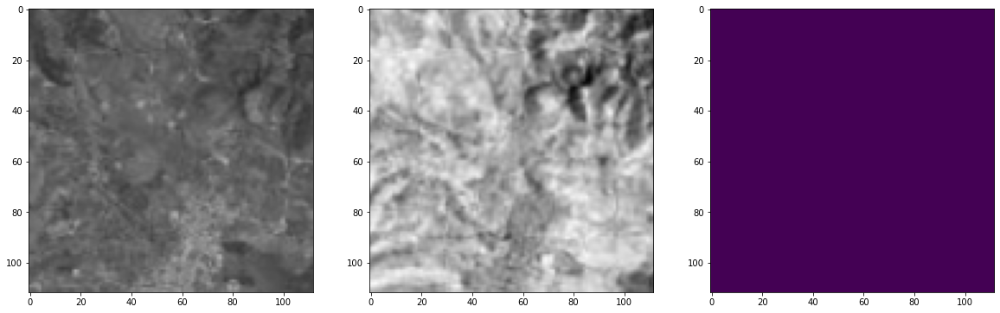

In [89]:
img1 = im_A
plt.imshow(img1)
plt.show()
img1 = np.asarray(img1)

img2 = im_B
img2 = np.asarray(img2)

lbl = im_C
lbl = np.asarray(lbl)

plt.figure(figsize=(40,60))
plt.subplot(1,3,1)
plt.imshow(img1[:,:])
plt.subplot(1,3,2)
plt.imshow(img2[:,:])
plt.subplot(1,3,3)
plt.imshow(lbl[:,:])
plt.show()

for i in range(200):
    x = np.random.randint(img1.shape[0]-IMAGE_SIZE)
    y = np.random.randint(img1.shape[1]-IMAGE_SIZE)
    mini_img1 = img1[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
    mini_img2 = img2[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE,:]
    mini_lbl = lbl[x:x+IMAGE_SIZE,y:y+IMAGE_SIZE]
    data = np.zeros([7,IMAGE_SIZE,IMAGE_SIZE])
    #print(data,"\n")
    data[:3,:,:] = mini_img1.transpose([2,0,1])
    data[3:6,:,:] = mini_img2.transpose([2,0,1])
    #print(mini_lbl)
    #print('\n')
    #print(data)
    #print(mini_lbl.shape)
    data[6,:,:] = mini_lbl[:,:,0]
    #file_nm = main_dir + 'data/test_img/' + "img" + str(i).zfill(3) + '.npy'
    #np.save(file_nm, data)
    if VISUALIZE and (i == 0 or i == 10):
        plt.figure(figsize=(20,30))
        plt.subplot(1,3,1)
        plt.imshow(mini_img1)
        plt.subplot(1,3,2)
        plt.imshow(mini_img2)
        plt.subplot(1,3,3)
        plt.imshow(mini_lbl[:,:,0])
        plt.show()


In [10]:
test_dir = MAIN_DIR+'/data/test_img/'
test_data = OSCD(test_dir)
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True)

loss_v = []
model.eval()
for i, data in enumerate(test_dataloader):
    x1, x2, lbl = data
    x1 = x1.to(device, dtype=torch.float)
    x2 = x2.to(device, dtype=torch.float)
    lbl = lbl.to(device, dtype=torch.long)
    y = model(x1, x2)
    #print("Compose images: ")
    #print(y)
    #print("\n\nGround Truth: ")
    #print(lbl)
    optimizer.zero_grad()
    loss = criterion(y, lbl)
    loss.backward()
    optimizer.step()
    loss_v.append(loss.item())


C:\Users\Marina\anaconda3\envs\IC2\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


In [11]:
#print(loss_v)
print('test:', np.mean(loss_v))

test: 0.4299651512689888
